# Neural networks code and tests notebook

# This notebook takes the flux, photon index and fratio data and try to predict classes from this data on a :

# - LSTM network
# - ConvLSTM network
# - Conv1D network

In [1]:
import numpy as np
from numpy import random
import pandas as pd
import re
import os
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import math
from scipy import interpolate
import sys 
from re import search
from astropy.io import fits
from astropy import units as u
from astropy.time import Time
from astropy.coordinates import SkyCoord
from astropy.coordinates import ICRS, Galactic, FK4, FK5  # Low-level frames
from astropy.coordinates import Angle, Latitude, Longitude
import shutil
from keras.callbacks import CSVLogger
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import glob
from datetime import datetime
from keras.layers import Conv1D, Dense, Dropout, Input, Concatenate, GlobalMaxPooling1D, BatchNormalization
from keras.layers.convolutional import MaxPooling1D
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from matplotlib import pyplot
import tensorflow.keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten,LSTM
from keras.utils import to_categorical
from keras.layers import Dense, Activation, Concatenate
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit # or StratifiedShuffleSplit
from pandas import DataFrame
from pyts.classification import BOSSVS
from pyts.multivariate.classification import MultivariateClassifier
import shutil
from keras.callbacks import CSVLogger
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit # or StratifiedShuffleSplit
from pandas import DataFrame
import sktime
from sktime.classification.distance_based import KNeighborsTimeSeriesClassifier

In [2]:
pathON="C:/Users/pierr/Documents_kanop/Shps/Pierre_points_for_louis/Bureau/interpo_ONOFF/Luigino/ON_data/"
pathOFF="C:/Users/pierr/Documents_kanop/Shps/Pierre_points_for_louis/Bureau/interpo_ONOFF/Luigino/OFF_data/"

In [3]:
#Storing in a list the adresses of all the data files in the notebook

data_files_ON=[]
file_names_ON=[]

data_files_OFF=[]
file_names_OFF=[]
data_files_ALL=[]
file_names_ALL=[]

#Storing in a list the adresses of all the data files in the notebook
for filename in os.listdir(pathOFF):
    f = os.path.join(pathOFF,filename)
    if os.path.isfile(f):
        data_files_OFF.append(f)
        file_names_OFF.append(filename)
        data_files_ALL.append(f)
        file_names_ALL.append(filename)
for filename in os.listdir(pathON):
    f = os.path.join(pathON,filename)
    if os.path.isfile(f):
        data_files_ON.append(f)
        file_names_ON.append(filename)
        data_files_ALL.append(f)
        file_names_ALL.append(filename)        

In [4]:
#Using data_files with only the 36 binning
Filter=True
binning=37


if Filter==True:
    
    idx_OFF=[]
    idx_ON=[]
    dataON=[]
    dataOFF=[]
    for i in range(len(data_files_OFF)):
        dataframe = pd.read_csv(data_files_OFF[i])
        lg = len(dataframe)
        
        if lg==binning:
            idx_OFF.append(i)
    
    for i in range(len(data_files_ON)):
        dataframe = pd.read_csv(data_files_ON[i])
        lg = len(dataframe)
        if lg==binning:
            idx_ON.append(i)


    for i in range(len(idx_OFF)):

        a=idx_OFF[i]
        dataOFF.append(data_files_OFF[a])
    for i in range(len(idx_ON)):

        a=idx_ON[i]
        dataON.append(data_files_ON[a])

idx = idx_OFF+idx_ON


In [27]:


lgON=len(dataON)
lgOFF=len(dataOFF)
lg=lgON+lgOFF
Labels = []

nbfeatures=2

a=binning
b=nbfeatures
c=lg

# multivariate

data_matrix= np.zeros((b,c,a))

#Construct data matrix
for j in range(len(dataOFF)):

    dataframe=pd.read_csv(dataOFF[j],index_col=[0])
    dataframe.columns=['MJD','Flux','Delta Flux','Photon Index','Delta Index','TS','fratio']

    data_matrix[0][j]=dataframe['Flux']
#     data_matrix[1][j]=dataframe['Photon Index']*dataframe['Flux']
    data_matrix[1][j]=dataframe['Photon Index']
    
for j in range(len(dataON)):

    v=j+len(dataOFF)
    dataframe=pd.read_csv(dataON[j],index_col=[0])
    dataframe.columns=['MJD','Flux','Delta Flux','Photon Index','Delta Index','TS','fratio']

    data_matrix[0][v]=dataframe['Flux']
#     data_matrix[1][v]=dataframe['Photon Index']*dataframe['Flux']
    data_matrix[1][v]=dataframe['Photon Index']     
#Creating labels
for i in range(lgOFF):
    
    Labels.append(int(0))
    
for i in range(lgON):
    Labels.append(int(1))



In [28]:
#Reshaping data matrix
data_matrix=data_matrix.reshape(c,nbfeatures,binning)

In [29]:
#LSTM architecture
from keras.layers import Conv1D
from sklearn.metrics import f1_score
ON_accuracy=[]
OFF_accuracy=[]
fscore=[]
FPOS=[]
FNEG= []

weight_for_0 = (1 / lgOFF) * (lg / 2.0)
weight_for_1 = (1 / lgON) * (lg / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}
callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=6, verbose=0, mode='auto',baseline=None, restore_best_weights=True)




for i in range(5):
    
    model = Sequential()
    model.add(LSTM(9,input_shape=(nbfeatures,binning),activation='tanh'))
    model.add(Dense(2, activation='softmax'))
    model.compile(loss=tensorflow.keras.losses.BinaryCrossentropy(reduction='sum'),optimizer='SGD', metrics=['binary_accuracy'])
    
    x_train, x_test, y_train, y_test = train_test_split(data_matrix, Labels, test_size=0.2, random_state=i)
    y_test2=y_test.copy()
    y_train = to_categorical(y_train)
    y_test = to_categorical(y_test)
    
    #fitting data
    model.fit(x_train, y_train,epochs=20,batch_size=1,class_weight=class_weight,callbacks=callback)

    print('Iteration no.',i)
    #Obtain the accuracy of prediction for each class
    prediction= model.predict(x_test)
    predicted_labels=[]
    
    for i in range(len(prediction)):
        if prediction[i][0]>0.5:
            predicted_labels.append(0)
        else:
            predicted_labels.append(1)
    on_score=0
    on_nbs=0
    off_nbs=0
    off_score=0
    foff=0
    fon=0
    for i in range(len(y_test)):
        if y_test2[i]==1 :
            on_nbs+=1
            if predicted_labels[i]==1:
                on_score+=1
            else : 
                fon+=1
        if y_test2[i]==0 :
            off_nbs+=1
            if predicted_labels[i]==0:
                off_score+=1 
            else:
                foff+=1
    if on_nbs>0:    
        ON_accuracy.append(100*(on_score/on_nbs))
        FPOS.append(100*(fon/on_nbs))
    OFF_accuracy.append(100*(off_score/off_nbs))
    FNEG.append(100*(foff/off_nbs))
    f1= f1_score(y_test2,predicted_labels,average='weighted')
    fscore.append(f1)
print("Accuracy for ON class: ",np.mean(ON_accuracy) ,"%")
print("Accuracy for OFF class: ",np.mean(OFF_accuracy) ,"%")
print("False Positive rate: ",np.mean(FPOS) ,"%")
print("False Negative rate: ",np.mean(FNEG) ,"%")
print("F1 score: ",np.mean(fscore))

Epoch 1/20
912/912 [==============================] - 3s 2ms/step - loss: 0.6267 - binary_accuracy: 0.6261
Epoch 2/20
912/912 [==============================] - 2s 2ms/step - loss: 0.5477 - binary_accuracy: 0.6162
Epoch 3/20
912/912 [==============================] - 2s 2ms/step - loss: 0.5088 - binary_accuracy: 0.6162
Epoch 4/20
912/912 [==============================] - 2s 2ms/step - loss: 0.4879 - binary_accuracy: 0.6162
Epoch 5/20
912/912 [==============================] - 2s 2ms/step - loss: 0.4722 - binary_accuracy: 0.6162
Epoch 6/20
912/912 [==============================] - 2s 2ms/step - loss: 0.4661 - binary_accuracy: 0.6162
Epoch 7/20
912/912 [==============================] - 2s 2ms/step - loss: 0.4614 - binary_accuracy: 0.6162
Iteration no. 0
8/8 [==============================] - 0s 2ms/step
Epoch 1/20
163/912 [====>.........................] - ETA: 1s - loss: 0.7002 - binary_accuracy: 0.5000

KeyboardInterrupt: 

In [30]:
# Conv/LSTM architecture
#LSTM architecture
from keras.layers import Conv1D
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
ON_accuracy=[]
OFF_accuracy=[]
fscore=[]
FPOS=[]
FNEG= []

weight_for_0 = (1 / lgOFF) * (lg / 2.0)
weight_for_1 = (1 / lgON) * (lg / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}
callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=2, verbose=0, mode='auto',baseline=None, restore_best_weights=True)




for i in range(1):
    
    model = Sequential()
    model.add(Dense(binning, activation='tanh', input_shape=(nbfeatures,binning),input_dim=nbfeatures))
    model.add(Conv1D(filters=20, kernel_size=1, activation='tanh'))
    model.add(Dropout(0.2))
    model.add(LSTM(20,input_shape=(20, nbfeatures), activation='tanh'))
    model.add(Flatten())
    model.add(Dense(2, activation='softmax'))
    model.compile(loss=tensorflow.keras.losses.BinaryCrossentropy(reduction='sum'),optimizer='SGD', metrics=['binary_accuracy'])
    x_train, x_test, y_train, y_test = train_test_split(data_matrix, Labels, test_size=0.4, random_state=i)
    y_test2=y_test.copy()
    y_train = to_categorical(y_train)
    y_test = to_categorical(y_test)
    
    #fitting data
    model.fit(x_train, y_train,epochs=5,batch_size=1,class_weight=class_weight,callbacks=callback)

    print('Iteration no.',i)
    #Obtain the accuracy of prediction for each class
    prediction= model.predict(x_test)
    predicted_labels=[]
    
    for i in range(len(prediction)):
        if prediction[i][0]>0.5:
            predicted_labels.append(0)
        else:
            predicted_labels.append(1)
    on_score=0
    on_nbs=0
    off_nbs=0
    off_score=0
    foff=0
    fon=0
    for i in range(len(y_test)):
        if y_test2[i]==1 :
            on_nbs+=1
            if predicted_labels[i]==1:
                on_score+=1
            else : 
                fon+=1
        if y_test2[i]==0 :
            off_nbs+=1
            if predicted_labels[i]==0:
                off_score+=1 
            else:
                foff+=1
    if on_nbs>0:    
        ON_accuracy.append(100*(on_score/on_nbs))
        FPOS.append(100*(fon/on_nbs))
    OFF_accuracy.append(100*(off_score/off_nbs))
    FNEG.append(100*(foff/off_nbs))
    f1= f1_score(y_test2,predicted_labels)
    fscore.append(f1)
print("Accuracy for ON class: ",np.mean(ON_accuracy) ,"%")
print("Accuracy for OFF class: ",np.mean(OFF_accuracy) ,"%")
print("False Positive rate: ",np.mean(FPOS) ,"%")
print("False Negative rate: ",np.mean(FNEG) ,"%")
print("F1 score: ",np.mean(fscore))

Epoch 1/5
684/684 [==============================] - 3s 2ms/step - loss: 0.6188 - binary_accuracy: 0.5504
Epoch 2/5
684/684 [==============================] - 2s 2ms/step - loss: 0.5283 - binary_accuracy: 0.6213
Epoch 3/5
684/684 [==============================] - 2s 2ms/step - loss: 0.4851 - binary_accuracy: 0.6213
Epoch 4/5
684/684 [==============================] - 1s 2ms/step - loss: 0.4673 - binary_accuracy: 0.6213
Iteration no. 0
15/15 [==============================] - 0s 2ms/step
Accuracy for ON class:  100.0 %
Accuracy for OFF class:  53.67647058823529 %
False Positive rate:  0.0 %
False Negative rate:  46.32352941176471 %
F1 score:  0.3368421052631579


In [31]:
dens = model.predict(x_test)

#print(dens)

OFFF=[]
ONN=[]
idx_ON=[]
idx_OFF=[]
for i in range(len(y_test)):
    
    if y_test2[i]==1:
        idx_ON.append(i)
    if y_test2[i]==0:
        idx_OFF.append(i)        

         
for i in range(len(dens)):
        
        OFFF.append(dens[i][0])
        ONN.append(dens[i][1])
        
ONN_true=[ONN[j] for j in idx_ON]
OFF_true=[ONN[j] for j in idx_OFF]

print(ONN_true)

15/15 [==============================] - 0s 2ms/step
[0.8720176, 0.8735125, 0.87548804, 0.869001, 0.8709325, 0.8645097, 0.87268156, 0.87147343, 0.8699188, 0.8697918, 0.86842465, 0.87117285, 0.869585, 0.87351817, 0.8726841, 0.8728401, 0.87220067, 0.8676016, 0.8716049, 0.867992, 0.8659557, 0.8726381, 0.8716133, 0.87150675, 0.87389123, 0.8723931, 0.8691697, 0.86982137, 0.8724244, 0.87289727, 0.87119305, 0.8723206, 0.8725458, 0.8546268, 0.87148213, 0.8684696, 0.8586851, 0.871543, 0.87230814, 0.8761242, 0.87321043, 0.86950654, 0.8712736, 0.86859083, 0.86637425, 0.87006056, 0.8696937, 0.87279314]


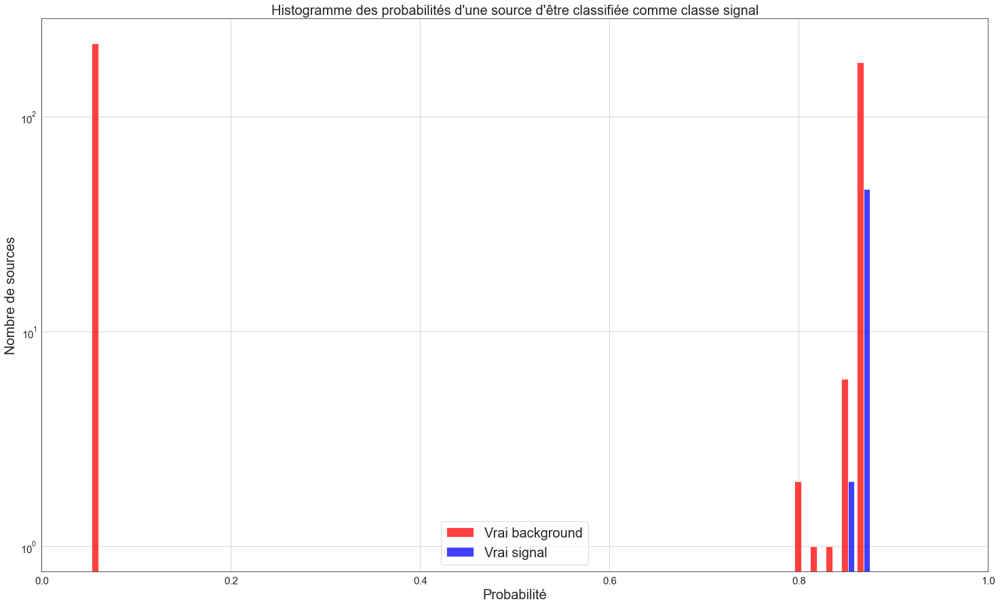

In [32]:
import seaborn as sns
sns.set_style("white")

# Plotting  model score distribution

#kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

colors = ['r','b']
labels=['Vrai background','Vrai signal']
fig = plt.figure(figsize=(25,15))
# ax1 = fig1.add_subplot(121)
plt.hist([OFF_true,ONN_true],50,color=colors,label=labels,alpha=0.75)
plt.xlabel("Probabilité",fontsize=20)
plt.ylabel("Nombre de sources",fontsize=20)
plt.title("Histogramme des probabilités d'une source d'être classifiée comme classe signal",fontsize=20)
#ax1.hist(OFF_true,20,color="r", label="Prob of being ON for all LC",density=True,alpha=0.75)
#ax1.hist(ONN_true,20,color="b", label="Prob of being ON for all LC",density=True,alpha=0.75)

#sns.distplot(ONN, color="g", label="Prob of beiung ON for all LC")
#sns.distplot(OFF_true, color="r", label="Prob of being ON for OFF LC")

plt.xlim(0,1)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
#sns.distplot(ONN, color="dodgerblue", label="Prob ON")
#sns.distplot(OFFF, color="orange", label="OFF")
#plt.title("Score density")
plt.yscale('log')
#plt.xlim(0,1)
#plt.ylim(0.01,800)
plt.grid()

plt.legend(fontsize=20);

In [36]:
from sklearn.metrics import f1_score

ON_accuracy=[]
OFF_accuracy=[]
fscore=[]
FPOS=[]
FNEG=[]
#Measuring the meaned accuracy of  correct prediction of labellisation for each class  over a defined number of steps
for i in range(1):
    nb_filters=20
    
    callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=2, verbose=0, mode='auto',baseline=None, restore_best_weights=True)

    #Conv1D Architecture
    model = Sequential()
    model.add(Conv1D(nb_filters, 1, padding="same", activation="tanh",input_shape=(nbfeatures,binning)))
    model.add(Conv1D(15, 1, padding="same", activation="tanh",input_shape=(nb_filters,binning)))
    model.add(Conv1D(9, 1, padding="same", activation="tanh",input_shape=(15,binning)))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(9, activation='tanh'))
    model.add(Dense(2, activation='softmax'))
    model.compile(loss=tensorflow.keras.losses.BinaryCrossentropy(reduction='none'),optimizer='SGD', metrics=['binary_accuracy'])


    x_train, x_test, y_train, y_test = train_test_split(data_matrix, Labels, test_size=0.4, random_state=i)
    y_test2=y_test.copy()
    y_train = to_categorical(y_train)
    y_test = to_categorical(y_test)
    
    #fitting data
    model.fit(x_train, y_train,epochs=5,batch_size=1,class_weight=class_weight,callbacks=callback)

    print('Iteration no.',i)
    #Obtain the accuracy of prediction for each class
    prediction= model.predict(x_test)
    predicted_labels=[]
    
    for i in range(len(prediction)):
        if prediction[i][0]>0.5:
            predicted_labels.append(0)
        else:
            predicted_labels.append(1)
    on_score=0
    on_nbs=0
    off_nbs=0
    off_score=0
    foff=0
    fon=0
    for i in range(len(y_test)):
        if y_test2[i]==1 :
            on_nbs+=1
            if predicted_labels[i]==1:
                on_score+=1
            else : 
                fon+=1
        if y_test2[i]==0 :
            off_nbs+=1
            if predicted_labels[i]==0:
                off_score+=1 
            else:
                foff+=1
    if on_nbs>0:    
        ON_accuracy.append(100*(on_score/on_nbs))
        FPOS.append(100*(fon/on_nbs))
    OFF_accuracy.append(100*(off_score/off_nbs))
    FNEG.append(100*(foff/off_nbs))
    f1= f1_score(y_test2,predicted_labels)
    fscore.append(f1)
print("Accuracy for ON class: ",np.mean(ON_accuracy) ,"%")
print("Accuracy for OFF class: ",np.mean(OFF_accuracy) ,"%")
print("False Positive rate: ",np.mean(FPOS) ,"%")
print("False Negative rate: ",np.mean(FNEG) ,"%")
print("F1 score: ",np.mean(fscore))

Epoch 1/5
684/684 [==============================] - 1s 1ms/step - loss: 0.5518 - binary_accuracy: 0.6279
Epoch 2/5
684/684 [==============================] - 1s 1ms/step - loss: 0.4773 - binary_accuracy: 0.6199
Epoch 3/5
684/684 [==============================] - 1s 1ms/step - loss: 0.4639 - binary_accuracy: 0.6213
Iteration no. 0
15/15 [==============================] - 0s 1ms/step
Accuracy for ON class:  100.0 %
Accuracy for OFF class:  53.92156862745098 %
False Positive rate:  0.0 %
False Negative rate:  46.07843137254902 %
F1 score:  0.33802816901408456


In [37]:
dens = model.predict(x_test)

#print(dens)

OFFF=[]
ONN=[]
idx_ON=[]
idx_OFF=[]
for i in range(len(y_test)):
    
    if y_test2[i]==1:
        idx_ON.append(i)
    if y_test2[i]==0:
        idx_OFF.append(i)        

         
for i in range(len(dens)):
        
        OFFF.append(dens[i][0])
        ONN.append(dens[i][1])
        
ONN_true=[ONN[j] for j in idx_ON]
OFF_true=[ONN[j] for j in idx_OFF]

print(ONN_true)

15/15 [==============================] - 0s 1ms/step
[0.84481466, 0.8686975, 0.85339445, 0.8532702, 0.8406033, 0.8639096, 0.8593846, 0.85996413, 0.8651294, 0.84841514, 0.84535956, 0.83198273, 0.8467007, 0.8709204, 0.8419318, 0.8529743, 0.85215944, 0.8625343, 0.86094606, 0.8556464, 0.84291786, 0.85551476, 0.8623705, 0.8552102, 0.8586447, 0.8582496, 0.81006426, 0.84473586, 0.8582992, 0.85479367, 0.8683959, 0.85409814, 0.8582149, 0.84979135, 0.86067617, 0.8550974, 0.8765658, 0.8543278, 0.8618071, 0.84551346, 0.8569631, 0.8538846, 0.8584484, 0.790733, 0.85495675, 0.8402975, 0.8631935, 0.8522203]


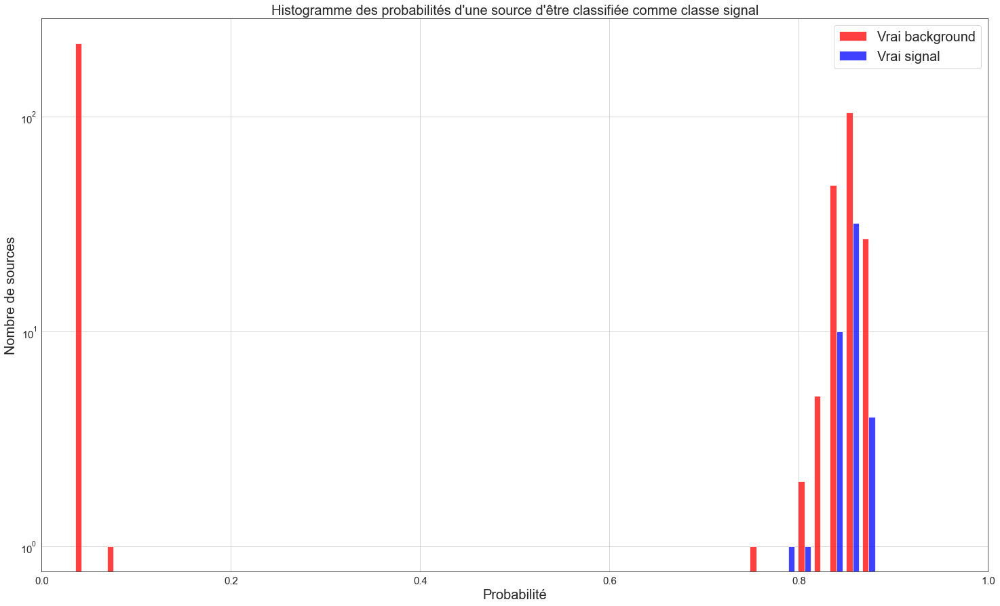

In [38]:
import seaborn as sns
sns.set_style("white")

# Plotting  model score distribution

#kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

colors = ['r','b']
labels=['Vrai background','Vrai signal']
fig = plt.figure(figsize=(25,15))
# ax1 = fig1.add_subplot(121)
plt.hist([OFF_true,ONN_true],50,color=colors,label=labels,alpha=0.75)
plt.xlabel("Probabilité",fontsize=20)
plt.ylabel("Nombre de sources",fontsize=20)
plt.title("Histogramme des probabilités d'une source d'être classifiée comme classe signal",fontsize=20)
#ax1.hist(OFF_true,20,color="r", label="Prob of being ON for all LC",density=True,alpha=0.75)
#ax1.hist(ONN_true,20,color="b", label="Prob of being ON for all LC",density=True,alpha=0.75)

#sns.distplot(ONN, color="g", label="Prob of beiung ON for all LC")
#sns.distplot(OFF_true, color="r", label="Prob of being ON for OFF LC")

plt.xlim(0,1)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
#sns.distplot(ONN, color="dodgerblue", label="Prob ON")
#sns.distplot(OFFF, color="orange", label="OFF")
#plt.title("Score density")
plt.yscale('log')
#plt.xlim(0,1)
#plt.ylim(0.01,800)
plt.grid()

plt.legend(fontsize=20);

In [43]:


lgON=len(dataON)
lgOFF=len(dataOFF)
lg=lgON+lgOFF
Labels = []

nbfeatures=3

a=binning
b=nbfeatures
c=lg

# multivariate

data_matrix= np.zeros((b,c,a))

#Construct data matrix
for j in range(len(dataOFF)):

    dataframe=pd.read_csv(dataOFF[j],index_col=[0])
    dataframe.columns=['MJD','Flux','Delta Flux','Photon Index','Delta Index','TS','fratio']

    data_matrix[0][j]=dataframe['Flux']
    data_matrix[1][j]=dataframe['Photon Index']*dataframe['Flux']
    data_matrix[2][j]=dataframe['Photon Index']
#     data_matrix[3][j]=dataframe['TS']
#     data_matrix[4][j]=dataframe['fratio']

for j in range(len(dataON)):

    v=j+len(dataOFF)
    dataframe=pd.read_csv(dataON[j],index_col=[0])
    dataframe.columns=['MJD','Flux','Delta Flux','Photon Index','Delta Index','TS','fratio']

    data_matrix[0][v]=dataframe['Flux']
    data_matrix[1][v]=dataframe['Photon Index']*dataframe['Flux']
    data_matrix[2][v]=dataframe['Photon Index']  
#     data_matrix[3][v]=dataframe['TS']
#     data_matrix[4][v]=dataframe['fratio']

#Creating labels
for i in range(lgOFF):
    
    Labels.append(int(0))
    
for i in range(lgON):
    Labels.append(int(1))


In [59]:
from sklearn.metrics import f1_score
from keras.layers import Conv1D

binning=37
#Reshaping data matrix
data_matrix=data_matrix.reshape(c,nbfeatures,binning)

ON_accuracy=[]
OFF_accuracy=[]
fscore=[]
FPOS=[]
FNEG= []

weight_for_0 = (1 / lgOFF) * (lg / 2.0)
weight_for_1 = (1 / lgON) * (lg / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}
callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=2, verbose=0, mode='auto',baseline=None, restore_best_weights=True)


#Measuring the meaned accuracy of  correct prediction of labellisation for each class  over a defined number of steps
for i in range(1,5):
    nb_filters=20
    
    callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=2, verbose=0, mode='auto',baseline=None, restore_best_weights=True)

    #Conv1D Architecture
    model = Sequential()
    model.add(Conv1D(9, 1, padding="same", activation="tanh",input_shape=(nbfeatures,binning)))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(9, activation='tanh'))
    model.add(Dense(2, activation='softmax'))
    model.compile(loss=tensorflow.keras.losses.BinaryCrossentropy(reduction='none'),optimizer='SGD', metrics=['binary_accuracy'])


    x_train, x_test, y_train, y_test = train_test_split(data_matrix, Labels, test_size=0.1, random_state=i)
    y_test2=y_test.copy()
    y_train = to_categorical(y_train)
    y_test = to_categorical(y_test)
    
    #fitting data
    model.fit(x_train, y_train,epochs=5,batch_size=1,class_weight=class_weight,callbacks=callback)

    print('Iteration no.',i)
    #Obtain the accuracy of prediction for each class
    prediction= model.predict(x_test)
    predicted_labels=[]
    
    for i in range(len(prediction)):
        if prediction[i][0]>0.5:
            predicted_labels.append(0)
        else:
            predicted_labels.append(1)
    on_score=0
    on_nbs=0
    off_nbs=0
    off_score=0
    foff=0
    fon=0
    for i in range(len(y_test)):
        if y_test2[i]==1 :
            on_nbs+=1
            if predicted_labels[i]==1:
                on_score+=1
            else : 
                fon+=1
        if y_test2[i]==0 :
            off_nbs+=1
            if predicted_labels[i]==0:
                off_score+=1 
            else:
                foff+=1
    if on_nbs>0:    
        ON_accuracy.append(100*(on_score/on_nbs))
        FPOS.append(100*(fon/on_nbs))
    OFF_accuracy.append(100*(off_score/off_nbs))
    FNEG.append(100*(foff/off_nbs))
    f1= f1_score(y_test2,predicted_labels,average='weighted')
    fscore.append(f1)
print("Accuracy for ON class: ",np.mean(ON_accuracy) ,"%")
print("Accuracy for OFF class: ",np.mean(OFF_accuracy) ,"%")
print("False Positive rate: ",np.mean(FPOS) ,"%")
print("False Negative rate: ",np.mean(FNEG) ,"%")
print("F1 score: ",np.mean(fscore))

Epoch 1/5
1026/1026 [==============================] - 1s 1ms/step - loss: 0.4769 - binary_accuracy: 0.6837
Epoch 2/5
1026/1026 [==============================] - 1s 1ms/step - loss: 0.3977 - binary_accuracy: 0.7027
Epoch 3/5
1026/1026 [==============================] - 1s 981us/step - loss: 0.3788 - binary_accuracy: 0.7027
Epoch 4/5
1026/1026 [==============================] - 1s 980us/step - loss: 0.3850 - binary_accuracy: 0.7027
Iteration no. 1
4/4 [==============================] - 0s 998us/step
Epoch 1/5
1026/1026 [==============================] - 1s 1000us/step - loss: 0.4496 - binary_accuracy: 0.7130
Epoch 2/5
1026/1026 [==============================] - 1s 1ms/step - loss: 0.3833 - binary_accuracy: 0.7115
Epoch 3/5
1026/1026 [==============================] - 1s 974us/step - loss: 0.3840 - binary_accuracy: 0.7115
Iteration no. 2
4/4 [==============================] - 0s 0s/step
Epoch 1/5
1026/1026 [==============================] - 1s 987us/step - loss: 0.4859 - binary_accurac

In [6]:

binning=37
#Reshaping data matrix
data_matrix=data_matrix.reshape(c,nbfeatures,binning)
x_train, x_test, y_train, y_test = train_test_split(data_matrix, Labels, test_size=0.1, random_state=2)
callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=2, verbose=0, mode='auto',baseline=None, restore_best_weights=True)

#Conv1D Architecture
model = Sequential()
model.add(Conv1D(9, 1, padding="same", activation="tanh",input_shape=(nbfeatures,binning)))
model.add(GlobalMaxPooling1D())
model.add(Dense(9, activation='tanh'))
model.add(Dense(2, activation='softmax'))
model.compile(loss=tensorflow.keras.losses.BinaryCrossentropy(reduction='none'),optimizer='SGD', metrics=['binary_accuracy'])
model.build()

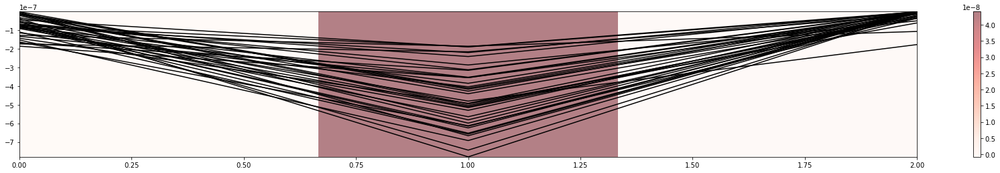

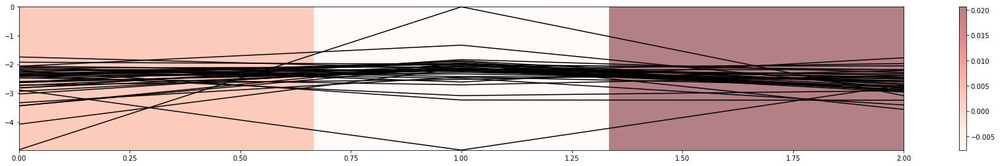

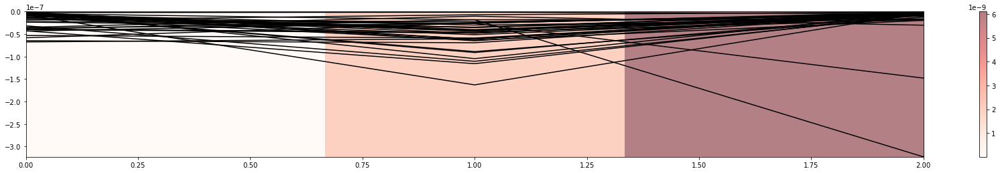

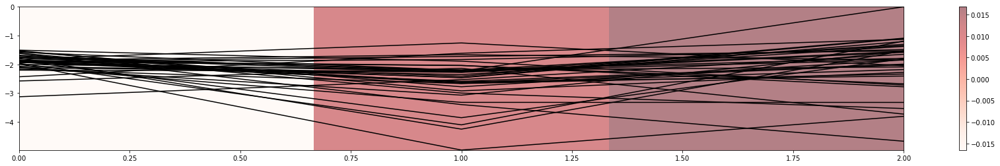

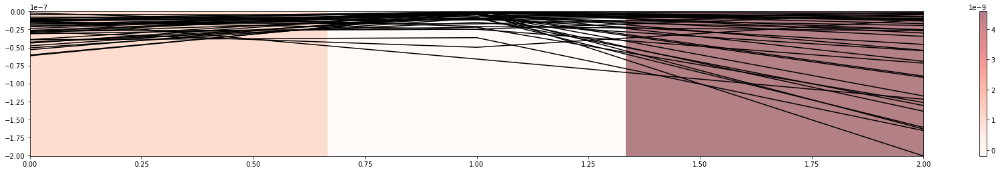

...

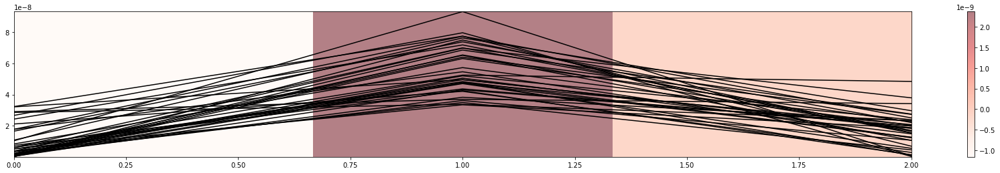

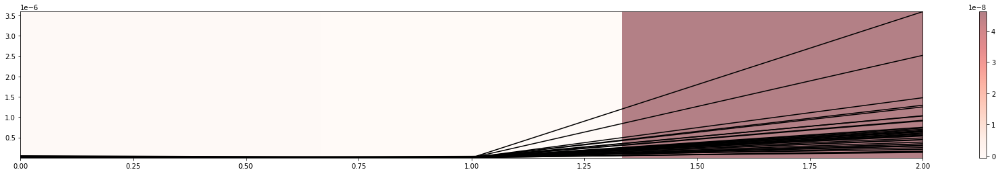

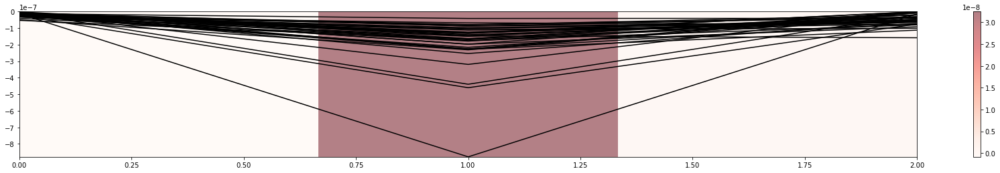

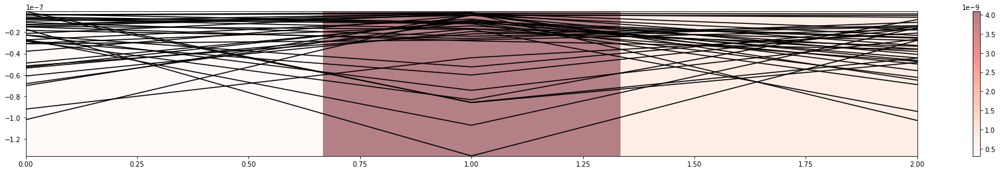

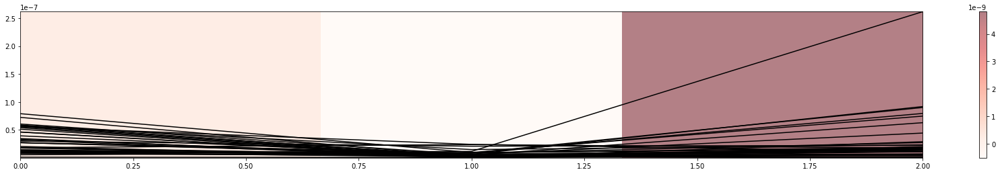

In [11]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def grad_cam(layer_name, data):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    last_conv_layer_output, preds = grad_model(data)

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(data)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    
    pooled_grads = tf.reduce_mean(grads, axis=(0))

    last_conv_layer_output = last_conv_layer_output[0]

    heatmap = last_conv_layer_output * pooled_grads
    heatmap = tf.reduce_mean(heatmap, axis=(1))
    heatmap = np.expand_dims(heatmap,0)
    return heatmap

layer_name = 'conv1d'
for i in x_test:
    data = np.expand_dims(i,0)
    heatmap = grad_cam(layer_name,data)

    plt.figure(figsize=(30,4))
    plt.imshow(np.expand_dims(heatmap,axis=2),cmap='Reds', aspect="auto", interpolation='nearest',extent=[0,2,i.min(),i.max()], alpha=0.5)
    plt.plot(i,'k')
    plt.colorbar()
    plt.show()

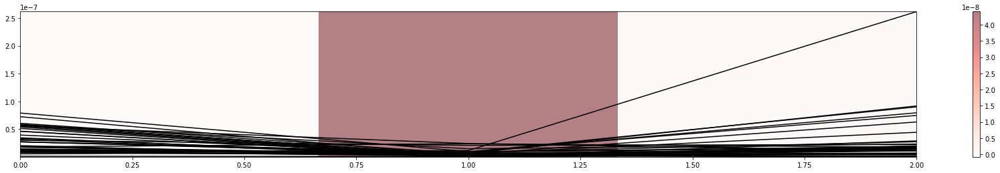

In [12]:

data = np.expand_dims(x_test[0],0)
heatmap = grad_cam(layer_name,data)

plt.figure(figsize=(30,4))
plt.imshow(np.expand_dims(heatmap,axis=2),cmap='Reds', aspect="auto", interpolation='nearest',extent=[0,2,i.min(),i.max()], alpha=0.5)
plt.plot(i,'k')
plt.colorbar()
plt.show()

In [19]:
x_test[0].shape
# np.expand_dims(heatmap,axis=2)

(3, 37)

In [79]:


lgON=len(dataON)
lgOFF=len(dataOFF)
lg=lgON+lgOFF
Labels = []

nbfeatures=1

a=binning
b=nbfeatures
c=lg

# multivariate

data_matrix= np.zeros((c,b,a))

#Construct data matrix
for j in range(len(dataOFF)):

    dataframe=pd.read_csv(dataOFF[j],index_col=[0])
    dataframe.columns=['MJD','Flux','Delta Flux','Photon Index','Delta Index','TS','fratio']

#     data_matrix[j][0]=dataframe['Flux']
    data_matrix[j][0]=dataframe['Photon Index']*dataframe['Flux']
#     data_matrix[j][2]=dataframe['Photon Index']
#     data_matrix[3][j]=dataframe['TS']
#     data_matrix[4][j]=dataframe['fratio']

for j in range(len(dataON)):

    v=j+len(dataOFF)
    dataframe=pd.read_csv(dataON[j],index_col=[0])
    dataframe.columns=['MJD','Flux','Delta Flux','Photon Index','Delta Index','TS','fratio']

#     data_matrix[v][0]=dataframe['Flux']
    data_matrix[v][0]=dataframe['Photon Index']*dataframe['Flux']
#     data_matrix[v][2]=dataframe['Photon Index']  
#     data_matrix[3][v]=dataframe['TS']
#     data_matrix[4][v]=dataframe['fratio']

#Creating labels
for i in range(lgOFF):
    
    Labels.append(int(0))
    
for i in range(lgON):
    Labels.append(int(1))


In [81]:
# Conv/LSTM architecture
#LSTM architecture
from keras.layers import Conv1D
from sklearn.metrics import f1_score
ON_accuracy=[]
OFF_accuracy=[]
fscore=[]
FPOS=[]
FNEG= []

weight_for_0 = (1 / lgOFF) * (lg / 2.0)
weight_for_1 = (1 / lgON) * (lg / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}
callback=tensorflow.keras.callbacks.EarlyStopping(monitor='binary_accuracy',patience=5, verbose=0, mode='auto',baseline=None, restore_best_weights=True)




for i in range(1,2):
    
    model = Sequential()
    model.add(Dense(binning, activation='tanh', input_shape=(nbfeatures,binning),input_dim=nbfeatures))
    model.add(Conv1D(filters=20, kernel_size=1, activation='tanh'))
    model.add(Dropout(0.2))
    model.add(LSTM(20,input_shape=(20, nbfeatures), activation='tanh'))
    model.add(Flatten())
    model.add(Dense(2, activation='softmax'))
    model.compile(loss=tensorflow.keras.losses.BinaryCrossentropy(reduction='sum'),optimizer='SGD', metrics=['binary_accuracy'])
    x_train, x_test, y_train, y_test = train_test_split(data_matrix, Labels, test_size=0.2, random_state=i)
    y_test2=y_test.copy()
    y_train = to_categorical(y_train)
    y_test = to_categorical(y_test)
    
    #fitting data
    model.fit(x_train, y_train,epochs=5,batch_size=1,class_weight=class_weight,callbacks=callback)

    print('Iteration no.',i)
    #Obtain the accuracy of prediction for each class
    prediction= model.predict(x_test)
    predicted_labels=[]
    
    for i in range(len(prediction)):
        if prediction[i][0]>0.5:
            predicted_labels.append(0)
        else:
            predicted_labels.append(1)
    on_score=0
    on_nbs=0
    off_nbs=0
    off_score=0
    foff=0
    fon=0
    for i in range(len(y_test)):
        if y_test2[i]==1 :
            on_nbs+=1
            if predicted_labels[i]==1:
                on_score+=1
            else : 
                fon+=1
        if y_test2[i]==0 :
            off_nbs+=1
            if predicted_labels[i]==0:
                off_score+=1 
            else:
                foff+=1
    if on_nbs>0:    
        ON_accuracy.append(100*(on_score/on_nbs))
        FPOS.append(100*(fon/on_nbs))
    OFF_accuracy.append(100*(off_score/off_nbs))
    FNEG.append(100*(foff/off_nbs))
    f1= f1_score(y_test2,predicted_labels,average='weighted')
    fscore.append(f1)
print("Accuracy for ON class: ",np.mean(ON_accuracy) ,"%")
print("Accuracy for OFF class: ",np.mean(OFF_accuracy) ,"%")
print("False Positive rate: ",np.mean(FPOS) ,"%")
print("False Negative rate: ",np.mean(FNEG) ,"%")
print("F1 score: ",np.mean(fscore))

Epoch 1/5
912/912 [==============================] - 3s 1ms/step - loss: 0.6787 - binary_accuracy: 0.6491
Epoch 2/5
912/912 [==============================] - 1s 1ms/step - loss: 0.6792 - binary_accuracy: 0.7993
Epoch 3/5
912/912 [==============================] - 1s 1ms/step - loss: 0.6794 - binary_accuracy: 0.9254
Epoch 4/5
912/912 [==============================] - 1s 1ms/step - loss: 0.6783 - binary_accuracy: 0.4770
Epoch 5/5
912/912 [==============================] - 1s 1ms/step - loss: 0.6779 - binary_accuracy: 0.8827
Iteration no. 1
8/8 [==============================] - 0s 3ms/step
Accuracy for ON class:  100.0 %
Accuracy for OFF class:  0.0 %
False Positive rate:  0.0 %
False Negative rate:  100.0 %
F1 score:  0.004441018865154517
